# Análisis Exploratorio de Datos (EDA): 

## Objetivo
Este notebook contiene el análisis exploratorio completo del dataset, siguiendo una estructura organizada y metódica para entender los datos, limpiarlos y prepararlos para modelado.

## Contenido
1. Configuración Inicial y librearías
2. Carga y Vista General de los Datos
3. Limpieza y Preprocesamiento
4. Análisis Exploratorio de los Datos
5. Análisis estadístico
6. Análisis Univariante
7. Análisis Bivariante
8. Feature Engineering
9. Conclusiones

# 1. Configuración Inicial

Importamos las bibliotecas necesarias y configuramos el entorno de trabajo.


In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import missingno as msno
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import os


### Configuración del estilo visual

In [12]:

sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (6, 4)
%matplotlib inline

In [13]:
print("Librerías importadas y configuración realizada.") 

Librerías importadas y configuración realizada.


### Configuración de pandas

In [14]:
pd.set_option('display.max_rows', 100) 
pd.set_option('display.max_columns', None) 


pd.set_option('display.width', None)        # No limit on display width
pd.set_option('display.expand_frame_repr', False)  # Prevent wrapping

# 2. Carga y Preparación de los Datos

### Cargamos el dataset y realizamos una inspección inicial para entender su estructura.


In [15]:
# Setting paths
current_dir = os.getcwd()  # Use os.getcwd() to get the current working directory
parent_dir = os.path.dirname(current_dir)
data_dir = os.path.join(parent_dir, "data")
file_path = os.path.join(data_dir, "")

raw_data_csv_path = os.path.join(data_dir, "raw_data.csv")
#----------------------------------------------------------------------------------------------------
# Creating dataframes
df_raw_data_sugar= pd.read_csv(raw_data_csv_path)

df_raw_data_sugar.head()


,Country,Year,Country_Code,Continent,Region,Population,GDP_Per_Capita,Per_Capita_Sugar_Consumption,Total_Sugar_Consumption,Sugar_From_Sugarcane,Sugar_From_Beet,Sugar_From_HFCS,Sugar_From_Other,Processed_Food_Consumption,Avg_Daily_Sugar_Intake,Diabetes_Prevalence,Obesity_Rate,Sugar_Imports,Sugar_Exports,Avg_Retail_Price_Per_Kg,Gov_Tax,Gov_Subsidies,Education_Campaign,Urbanization_Rate,Climate_Conditions,Sugarcane_Production_Yield
0,France,1972,FRA,Europe,Western Europe,2.617306e+08,8692.631696,12.827741,3.357413e+06,68.422963,38.600384,42.970760,-49.994107,171.966182,35.148009,11.495111,34.094017,5.401670e+06,2.358929e+06,3.864020,0.0,0,0.0,34.503398,3,52.433972
1,Australia,2003,AUS,Oceania,Australia & New Zealand,1.737965e+08,6859.195960,21.362632,3.712750e+06,55.432564,38.463620,16.223681,-10.119866,229.238022,58.533611,6.517479,16.040118,3.418790e+06,9.694348e+06,3.282101,0.0,0,0.0,31.783067,4,58.382055
2,Germany,1963,DEU,Europe,Western Europe,1.236366e+08,22075.950575,32.077485,3.965951e+06,86.466120,10.001416,51.720631,-48.188167,203.263252,87.892309,8.252688,14.405741,8.987281e+06,5.451632e+06,1.097687,0.0,0,0.0,51.551345,1,32.184735
3,France,1965,FRA,Europe,Western Europe,2.989961e+08,3728.027392,47.648930,1.424685e+07,69.806707,34.005173,43.573774,-47.385654,34.177283,130.558067,10.997905,38.499271,5.179004e+06,8.048500e+06,2.761297,0.0,0,0.0,80.386281,2,84.296019
4,Germany,2010,DEU,Europe,Western Europe,7.341531e+06,40420.973962,23.214343,1.704288e+05,63.772278,23.105924,53.543595,-40.421797,78.733482,63.607299,14.893879,36.190977,6.463439e+06,7.062910e+06,4.219431,0.0,0,1.0,49.701153,3,66.110815


### Vista general del dataset

In [16]:

# información de los datos
df_raw_data_sugar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 26 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Country                       10000 non-null  object 
 1   Year                          10000 non-null  int64  
 2   Country_Code                  10000 non-null  object 
 3   Continent                     10000 non-null  object 
 4   Region                        10000 non-null  object 
 5   Population                    10000 non-null  float64
 6   GDP_Per_Capita                10000 non-null  float64
 7   Per_Capita_Sugar_Consumption  10000 non-null  float64
 8   Total_Sugar_Consumption       10000 non-null  float64
 9   Sugar_From_Sugarcane          10000 non-null  float64
 10  Sugar_From_Beet               10000 non-null  float64
 11  Sugar_From_HFCS               10000 non-null  float64
 12  Sugar_From_Other              10000 non-null  float64
 13  Pr

# 3. Limpieza y Preprocesamiento

### Limpieza de Nombres de Columnas y Valores Faltantes

In [17]:
# Limpieza de nombres de columnas
df_raw_data_sugar.columns= df_raw_data_sugar.columns.str.lower().str.strip() # First, let's clean the spaces

In [18]:
def check_missing_data(df):
    nulls = df.isnull().sum()
    null_percentage = (nulls / len(df) * 100)
    missing_data = pd.DataFrame({
        'Missing Values': nulls,
        'Percentage': null_percentage
    })
    return missing_data.sort_values('Missing Values', ascending=False)

missing_data = check_missing_data(df_raw_data_sugar)
print("Análisis de valores faltantes:")
print(missing_data[missing_data['Missing Values'] > 0])
# Visualizar los datos faltantes  


Análisis de valores faltantes:
                    Missing Values  Percentage
gov_tax                        531        5.31
education_campaign             520        5.20


### Detección de duplicados

In [19]:
def check_duplicates(df_raw_data_sugar, subset=None):
    dups = df_raw_data_sugar[df_raw_data_sugar.duplicated(subset=subset, keep=False)]
    pd.set_option('display.max_rows', 5) 
    print(f"Duplicates ({len(dups)}):\n{dups}" if not dups.empty else "No duplicates found.")

check_duplicates(df_raw_data_sugar) 

No duplicates found.


### Búsqueda de valores desconocidos

In [20]:

def check_unknowns(df_raw_data_sugar):
    unknown_variants = ['unknown', 'Unknown', 'UNK', 'unk', 'n/a', 'N/A', 'na', 'NA']
    found = False
    
    for col in df_raw_data_sugar.columns:
        if df_raw_data_sugar[col].astype(str).isin(unknown_variants).any():
            print(f"⚠️ Se encontraron valores 'unknown' en la columna: {col}")
            found = True

    if not found:
        print("✅ No se encontraron valores 'unknown', 'n/a' o similares en ninguna columna.")

# Llamas a la función así:
check_unknowns(df_raw_data_sugar)


✅ No se encontraron valores 'unknown', 'n/a' o similares en ninguna columna.


Resultado: no se encontraron valores nulos o desconocidos.

## Análisis de valores faltantes

En esta sección, analizamos los valores faltantes en el dataset para entender su distribución y decidir cómo manejarlos.


#### 1.Porcentaje de valores NaN por columna 
El porcentaje de valores `NaN` por columna nos ayuda a identificar qué variables tienen datos faltantes y en qué proporción. Esto es útil para decidir si debemos eliminar columnas, imputar valores o manejar los datos faltantes de otra manera.


In [21]:

nan_percentages = (df_raw_data_sugar.isnull().sum() / len(df_raw_data_sugar)) * 100
print("\nPorcentaje de valores NaN por columna:\n", nan_percentages)


Porcentaje de valores NaN por columna:
 country                       0.0
year                          0.0
                             ... 
climate_conditions            0.0
sugarcane_production_yield    0.0
Length: 26, dtype: float64


Resultado: Gov_Tax y Education_campaing tienen porcentaje de valores NaN.

### Porcentaje de NaN por país y por región

In [84]:
for cat_col in ['country', 'continent']:
    print(f"\nPorcentaje de NaN en 'gov_tax' por {cat_col}:")
    print(df_raw_data_sugar.groupby(cat_col)['gov_tax'].apply(lambda x: x.isnull().sum() / len(x) * 100))

    print(f"\nPorcentaje de NaN en 'Education_Campaign' por {cat_col}:")
    print(df_raw_data_sugar.groupby(cat_col)['education_campaign'].apply(lambda x: x.isnull().sum() / len(x) * 100))


Porcentaje de NaN en 'gov_tax' por country:
country
Australia       0.0
Brazil          0.0
China           0.0
France          0.0
Germany         0.0
India           0.0
Indonesia       0.0
Japan           0.0
Mexico          0.0
Russia          0.0
South Africa    0.0
USA             0.0
Name: gov_tax, dtype: float64

Porcentaje de NaN en 'Education_Campaign' por country:
country
Australia       0.0
Brazil          0.0
China           0.0
France          0.0
Germany         0.0
India           0.0
Indonesia       0.0
Japan           0.0
Mexico          0.0
Russia          0.0
South Africa    0.0
USA             0.0
Name: education_campaign, dtype: float64

Porcentaje de NaN en 'gov_tax' por continent:
continent
Africa           0.0
Asia             0.0
Europe           0.0
North America    0.0
Oceania          0.0
South America    0.0
Name: gov_tax, dtype: float64

Porcentaje de NaN en 'Education_Campaign' por continent:
continent
Africa           0.0
Asia             0.0
Europe   

### Visualización de valores faltantes

En esta sección, utilizamos la biblioteca `missingno` para analizar los valores faltantes en el dataset. Estas visualizaciones nos ayudan a identificar patrones de valores faltantes y su relación con otras columnas.

#### 1. Matriz de valores faltantes
La matriz de valores faltantes muestra la presencia o ausencia de datos en cada columna. Esto es útil para identificar patrones de valores faltantes y su distribución en el dataset.


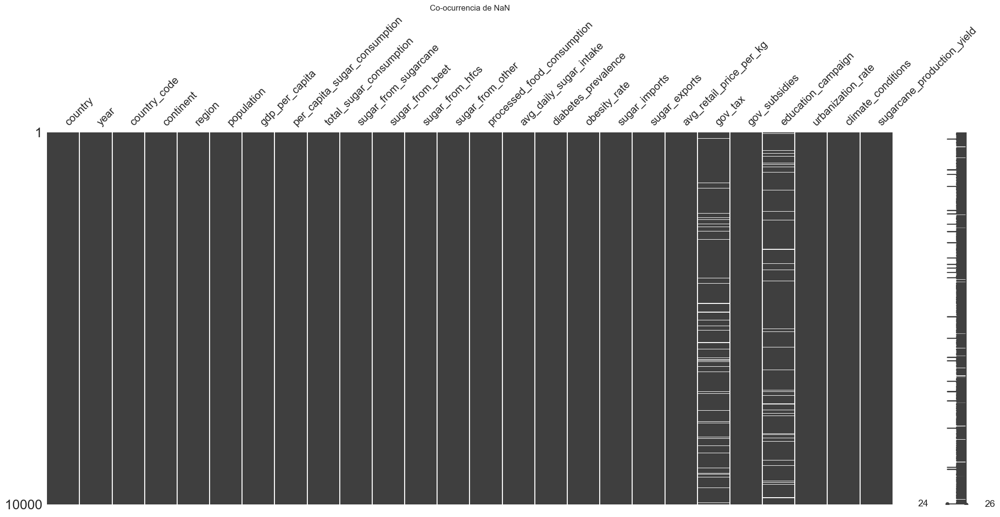

In [23]:
import missingno as msno
import matplotlib.pyplot as plt

msno.matrix(df_raw_data_sugar)
plt.title('Co-ocurrencia de NaN')
plt.show()



#### 2. Mapa de calor de correlación de nulidad
El mapa de calor de correlación de nulidad muestra la relación entre las columnas en términos de valores faltantes. Si dos columnas tienen una alta correlación de nulidad, significa que tienden a tener valores faltantes en los mismos registros.

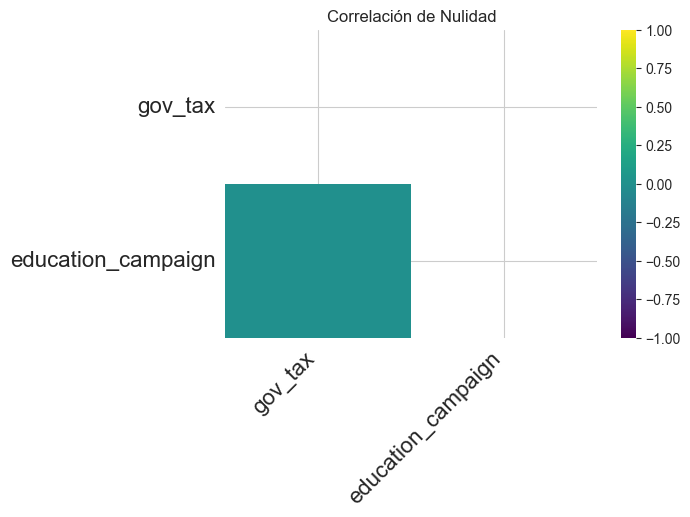

In [24]:
msno.heatmap(df_raw_data_sugar, figsize=(6, 4), cmap='viridis')
plt.title('Correlación de Nulidad')
plt.show()

Resultado: Ambos gráficos indican que no hay una relación relevante entre las variables en términos de valores faltantes. Esto implica que los valores `NaN` pueden ser tratados de manera independiente para cada columna.


### Análisis de valores faltantes en `Gov_Tax` por año

En esta sección, analizamos la frecuencia de valores faltantes (`NaN`) en la columna `Gov_Tax`, agrupados por año. Esto nos ayuda a identificar si los valores faltantes están concentrados en ciertos períodos de tiempo.

In [26]:

df_raw_data_sugar['year'] = pd.to_datetime(df_raw_data_sugar['year'], format='%Y', errors='coerce')

if 'Gov_Tax' in df_raw_data_sugar.columns and 'year' in df_raw_data_sugar.columns:
    nan_gov_tax_by_year = df_raw_data_sugar[df_raw_data_sugar['Gov_Tax'].isnull()]['year'].dt.year.value_counts().sort_index()
    print("\nFrecuencia de NaN en 'Gov_Tax' por año:\n", nan_gov_tax_by_year)
else:
    print("\nNo se encontraron las columnas 'Gov_Tax' o 'year'.")




No se encontraron las columnas 'Gov_Tax' o 'year'.


Resultado: Este análisis sugiere que los valores faltantes en `Gov_Tax` no están concentrados en un período específico, pero algunos años tienen una cantidad significativamente mayor de datos faltantes. Esto podría deberse a problemas en la recopilación de datos durante esos años. Dependiendo de la importancia de esta columna, se pueden imputar los valores faltantes o excluir los años con más datos faltantes del análisis.

#### Análisis de NaN en 'Education_Campaign' por año

In [27]:

if 'Education_Campaign' in df_raw_data_sugar.columns and 'Year' in df_raw_data_sugar.columns:
    nan_education_by_year = df_raw_data_sugar[df_raw_data_sugar['Education_Campaign'].isnull()]['Year'].dt.year.value_counts().sort_index()
    print("\nFrecuencia de NaN en 'Education_Campaign' por año:\n", nan_education_by_year)
else:
    print("\nNo se encontraron las columnas 'Education_Campaign' o 'Year'.")


No se encontraron las columnas 'Education_Campaign' o 'Year'.


In [32]:
for country in df_raw_data_sugar['country'].unique():
    nan_by_year_country_edu = df_raw_data_sugar[df_raw_data_sugar['country'] == country]['year'][df_raw_data_sugar['education_campaign'].isnull()].dt.year.value_counts().sort_index()
    if not nan_by_year_country_edu.empty:
        print(f"\nFrecuencia de NaN en 'Education_Campaign' por año para {country}:\n", nan_by_year_country_edu)


Frecuencia de NaN en 'Education_Campaign' por año para France:
 year
1961    2
1965    3
       ..
2022    2
2023    1
Name: count, Length: 26, dtype: int64

Frecuencia de NaN en 'Education_Campaign' por año para Australia:
 year
1961    1
1964    1
       ..
2016    1
2019    1
Name: count, Length: 29, dtype: int64

Frecuencia de NaN en 'Education_Campaign' por año para Germany:
 year
1961    1
1964    3
       ..
2022    2
2023    1
Name: count, Length: 37, dtype: int64

Frecuencia de NaN en 'Education_Campaign' por año para South Africa:
 year
1960    1
1962    1
       ..
2022    3
2023    1
Name: count, Length: 36, dtype: int64

Frecuencia de NaN en 'Education_Campaign' por año para India:
 year
1960    1
1961    1
       ..
2017    1
2018    3
Name: count, Length: 26, dtype: int64

Frecuencia de NaN en 'Education_Campaign' por año para Mexico:
 year
1960    1
1961    2
       ..
2021    1
2023    2
Name: count, Length: 33, dtype: int64

Frecuencia de NaN en 'Education_Campaign' 

### Análisis de valores faltantes en `Education_Campaign` por país y año

En esta sección, analizamos la cantidad de valores faltantes (`NaN`) en la columna `Education_Campaign`, agrupados por país y año. Esto nos ayuda a identificar si los valores faltantes están concentrados en ciertos países o períodos de tiempo.

In [36]:
pd.set_option('display.max_rows', None)

if 'education_campaign' in df_raw_data_sugar.columns and 'year' in df_raw_data_sugar.columns and 'country' in df_raw_data_sugar.columns:
    nan_education_by_year_country_all = df_raw_data_sugar.groupby(['country', 'year'])['education_campaign'].apply(lambda x: x.isnull().sum())
    print("\nCantidad de NaN en 'education_campaign' por país y año (mostrando todos los casos):\n")
    print(nan_education_by_year_country_all[nan_education_by_year_country_all > 0])
else:
    print("\nNo se encontraron las columnas 'education_campaign', 'year' o 'country'.")



Cantidad de NaN en 'education_campaign' por país y año (mostrando todos los casos):

country       year      
Australia     1961-01-01    1
              1964-01-01    1
              1966-01-01    2
              1970-01-01    1
              1976-01-01    1
              1977-01-01    1
              1978-01-01    3
              1981-01-01    2
              1983-01-01    1
              1984-01-01    2
              1987-01-01    1
              1988-01-01    1
              1989-01-01    1
              1990-01-01    1
              1991-01-01    5
              1994-01-01    1
              1996-01-01    1
              1997-01-01    1
              1999-01-01    2
              2002-01-01    1
              2003-01-01    1
              2004-01-01    1
              2007-01-01    1
              2011-01-01    1
              2012-01-01    1
              2013-01-01    1
              2014-01-01    1
              2016-01-01    1
              2019-01-01    1
Brazil        1961-

#### Casos con mayor cantidad de valores faltantes

En este análisis, identificamos los casos donde la cantidad de valores faltantes (`NaN`) es mayor. Estos picos podrían ser indicativos de problemas específicos en la recopilación de datos durante ciertos años en algunos países.

**Casos destacados:**
- **Australia en 1991**: 5 valores faltantes.
- **India en 1991**: 5 valores faltantes.
- **Indonesia en 1984**: 4 valores faltantes.
- **México en 1991**: 4 valores faltantes.
- **USA en 2016**: 4 valores faltantes.
- **South Africa**:
  - 1965: 3 valores faltantes.
  - 1985: 3 valores faltantes.
  - 2022: 3 valores faltantes.
- **Brasil**:
  - 1977: 3 valores faltantes.
  - 1985: 3 valores faltantes.
- **China**:
  - 1960: 3 valores faltantes.
  - 1961: 3 valores faltantes.
  - 1991: 3 valores faltantes.

Estos picos de valores faltantes podrían deberse a problemas específicos en la recopilación de datos durante esos años en los países mencionados. Es importante considerar si estos valores faltantes deben ser imputados o si los años con más datos faltantes deben ser excluidos del análisis.

#### Contexto histórico relacionado con los valores faltantes

Los valores faltantes (`NaN`) están dispersos a lo largo de los años (1960-2023) con cierta variabilidad anual, sin una tendencia clara. Sin embargo, algunos eventos históricos y sociales pueden ayudar a contextualizar los datos faltantes, especialmente en años clave como 1991.

**Australia en 1991**:
- En 1991, la **Organización Mundial de la Salud (OMS)** y la **Federación Internacional de la Diabetes (FID)** crearon el **Día Mundial de la Diabetes** para concientizar sobre esta enfermedad.
- Ese mismo año, se estableció por primera vez el **National Diabetes Strategy (Estrategia Nacional para la Diabetes)** en Australia.
- Antes de 1991, la educación sobre diabetes existía, pero era regional, limitada y fragmentada.

**India en 1991**:
- Debido al aumento de casos de diabetes en la India, se fundaron:
  - **Lifeline Express**: Un tren-hospital lanzado en 1991 que ofrecía atención médica, incluida la relacionada con la diabetes, en zonas rurales.
  - **Dr. Mohan’s Diabetes Centre**: Fundado en 1991 en Chennai, se convirtió en un referente en tratamiento y educación sobre diabetes.

Estos eventos reflejan un aumento en la atención global hacia la diabetes en 1991, lo que podría haber influido en la recopilación de datos o en la priorización de recursos en ciertos países y regiones.

### Imputación de valores faltantes

- Imputar valores faltantes en 'gov_tax' y 'education_campaign' con 0

Justificación: Los valores faltantes en gov_tax y education_campaign podrían deberse a la ausencia de políticas de impuestos o campañas educativas en ciertos años o países, según el análisis previo. Imputarlos con 0 es una decisión lógica que representa esta ausencia, evita eliminar filas del dataset y preserva la mayor cantidad de datos posible para el análisis y modelado. Además, esta imputación no introduce sesgos significativos, ya que los valores faltantes no muestran un patrón relevante ni están relacionados con otras variables.

In [37]:

df_raw_data_sugar['gov_tax'] = df_raw_data_sugar['gov_tax'].fillna(0)
df_raw_data_sugar['education_campaign'] = df_raw_data_sugar['education_campaign'].fillna(0)

print("Los valores faltantes en 'gov_tax' y 'education_campaign' han sido imputados con 0.")

Los valores faltantes en 'gov_tax' y 'education_campaign' han sido imputados con 0.


### Eliminación de columnas redundantes. 
Investigar si la columna region es relevante para el análisis

In [38]:
if 'Region' in df_raw_data_sugar.columns and 'Obesity_Rate' in df_raw_data_sugar.columns:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='Region', y='Obesity_Rate', data=df_raw_data_sugar)
    plt.title('Distribución de Tasa de Obesidad por Región')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

Resultado: El gráfico nos enseña que la obesidad es bastante parecida en todas las regiones grandes que muestra. Los niveles típicos, los valores medios y qué tanto varían los datos de obesidad son muy similares entre las regiones. Esto quiere decir que la "Región" no nos ayuda mucho a separar países con niveles de obesidad muy distintos, así que probablemente no sea muy útil para predecir la obesidad por país. Las regiones grandes no muestran las diferencias importantes en cuánta obesidad hay en los países.

#### Verificar la Redundancia con la Columna country

In [41]:
country_code_unique_per_country = df_raw_data_sugar.groupby('country')['country_code'].nunique()
if (country_code_unique_per_country > 1).any():
    print("Advertencia: Algunos países tienen múltiples códigos.")
else:
    print("Cada país tiene un único código asociado.")



Cada país tiene un único código asociado.


#### Verificar la unicidad de los países por código

In [43]:
country_unique_per_country_code = df_raw_data_sugar.groupby('country_code')['country'].nunique()
if (country_unique_per_country_code > 1).any():
    print("Advertencia: Algunos códigos corresponden a múltiples países.")
else:
    print("Cada código corresponde a un único país.")

print("\nEjemplos de correspondencia País - Código:")
print(df_raw_data_sugar[['country', 'country_code']].head())

Cada código corresponde a un único país.

Ejemplos de correspondencia País - Código:
     country country_code
0     France          FRA
1  Australia          AUS
2    Germany          DEU
3     France          FRA
4    Germany          DEU


La columna 'country_code' contiene la misma información que la columna 'Country', pero en forma de código. Como cada país tiene un único código y viceversa, 'country_code' es redundante para nuestro análisis a nivel de país y puede eliminarse sin perder información importante para el modelado.

Resultado: Tanto 'Region' como 'country_code' son columnas que aportan información redundante o no esencial para nuestro análisis predictivo a nivel de país, por lo que pueden ser eliminadas para simplificar el dataset.

In [45]:
#eliminamos las dos columnas que no son necesarias
df_raw_data_sugar = df_raw_data_sugar.drop(columns=['region', 'country_code'])

#### Guardamos el nuevo csv

In [46]:
file_path = 'cleaned_data_sugar.csv'

df_raw_data_sugar.to_csv(file_path, index=False)

print(f"El DataFrame limpio se ha guardado como: {file_path}")

El DataFrame limpio se ha guardado como: cleaned_data_sugar.csv


#### Normalización variables numéricas

In [ ]:
from sklearn.preprocessing import StandardScaler

# Seleccionar columnas numéricas
numeric_columns = df_raw_data_sugar.select_dtypes(include=['float64', 'int64']).columns

# Normalizar las variables numéricas
scaler = StandardScaler()
df_raw_data_sugar[numeric_columns] = scaler.fit_transform(df_raw_data_sugar[numeric_columns])

print("Variables numéricas normalizadas.")

# 4 Análisis exploratorio de datos

### Distribución de la prevalencia de diabetes

En este análisis, visualizamos la distribución de la prevalencia de diabetes en relación con el consumo de azúcar. El histograma muestra la frecuencia de los valores, mientras que la curva KDE suaviza la distribución para identificar patrones. También se incluyen líneas verticales que representan la media y la mediana de los datos.

In [47]:
file_path = 'cleaned_data_sugar.csv'
df_raw_data_sugar= pd.read_csv(file_path)
df_raw_data_sugar.head()

,country,year,continent,population,gdp_per_capita,per_capita_sugar_consumption,total_sugar_consumption,sugar_from_sugarcane,sugar_from_beet,sugar_from_hfcs,sugar_from_other,processed_food_consumption,avg_daily_sugar_intake,diabetes_prevalence,obesity_rate,sugar_imports,sugar_exports,avg_retail_price_per_kg,gov_tax,gov_subsidies,education_campaign,urbanization_rate,climate_conditions,sugarcane_production_yield
0,France,1972-01-01,Europe,2.617306e+08,8692.631696,12.827741,3.357413e+06,68.422963,38.600384,42.970760,-49.994107,171.966182,35.148009,11.495111,34.094017,5.401670e+06,2.358929e+06,3.864020,0.0,0,0.0,34.503398,3,52.433972
1,Australia,2003-01-01,Oceania,1.737965e+08,6859.195960,21.362632,3.712750e+06,55.432564,38.463620,16.223681,-10.119866,229.238022,58.533611,6.517479,16.040118,3.418790e+06,9.694348e+06,3.282101,0.0,0,0.0,31.783067,4,58.382055
2,Germany,1963-01-01,Europe,1.236366e+08,22075.950575,32.077485,3.965951e+06,86.466120,10.001416,51.720631,-48.188167,203.263252,87.892309,8.252688,14.405741,8.987281e+06,5.451632e+06,1.097687,0.0,0,0.0,51.551345,1,32.184735
3,France,1965-01-01,Europe,2.989961e+08,3728.027392,47.648930,1.424685e+07,69.806707,34.005173,43.573774,-47.385654,34.177283,130.558067,10.997905,38.499271,5.179004e+06,8.048500e+06,2.761297,0.0,0,0.0,80.386281,2,84.296019
4,Germany,2010-01-01,Europe,7.341531e+06,40420.973962,23.214343,1.704288e+05,63.772278,23.105924,53.543595,-40.421797,78.733482,63.607299,14.893879,36.190977,6.463439e+06,7.062910e+06,4.219431,0.0,0,1.0,49.701153,3,66.110815


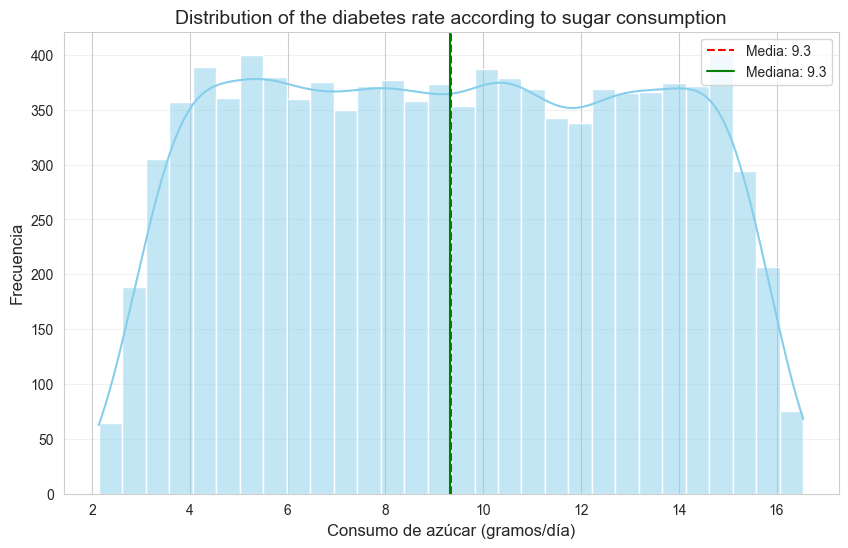

In [48]:
plt.figure(figsize=(10, 6))
sns.histplot(df_raw_data_sugar["diabetes_prevalence"], kde=True, bins=30, color='skyblue')
plt.title("Distribution of the diabetes rate according to sugar consumption", fontsize=14)
plt.xlabel("Consumo de azúcar (gramos/día)", fontsize=12)
plt.ylabel("Frecuencia", fontsize=12)

# Añadir media y mediana
mean = df_raw_data_sugar["diabetes_prevalence"].mean()
median = df_raw_data_sugar["diabetes_prevalence"].median()
plt.axvline(mean, color='red', linestyle='--', label=f'Media: {mean:.1f}')
plt.axvline(median, color='green', linestyle='-', label=f'Mediana: {median:.1f}')

plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.show()

Hallazgos: No tiene una forma de campana típica de una distribución normal

### Distribución de países por continente
En este análisis, visualizamos la distribución de países por continente en el dataset. Este gráfico de barras muestra cuántos países pertenecen a cada continente, lo que nos ayuda a entender la representación geográfica de los datos.

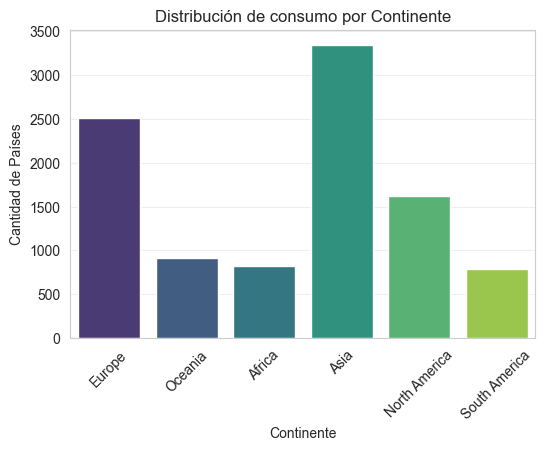

In [49]:
# distribucion de continentes
sns.countplot(x='continent', data=df_raw_data_sugar, hue='continent', palette='viridis', legend=False)
plt.title("Distribución de consumo por Continente")
plt.xlabel("Continente")
plt.ylabel("Cantidad de Países")
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.show()

Hallazgos:  Los continentes con mayor representación en el dataset son Europa y Asia.

### Mapa de calor de correlaciones

En este análisis, generamos un mapa de calor para visualizar las correlaciones entre las variables numéricas del dataset. Este gráfico nos ayuda a identificar relaciones fuertes (positivas o negativas) entre las características, lo que puede ser útil para el análisis posterior y la selección de variables.

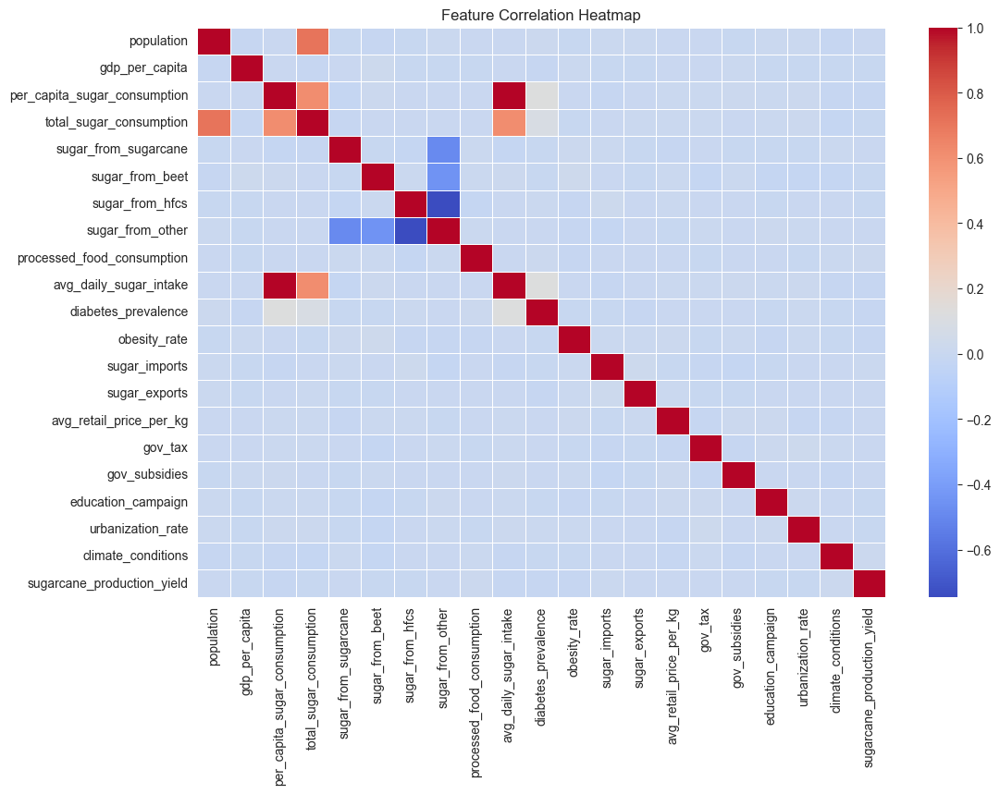

In [50]:

numeric_df = df_raw_data_sugar.select_dtypes(include=[np.number])

# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), cmap="coolwarm", annot=False, linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

#### Hallazgos del mapa de calor de correlaciones

1. **Correlaciones positivas fuertes**:
   - Variables como per_capita_sugar_consumption, avg_daily_sugar_intake, total_sugar_consumption y population están altamente relacionadas, lo que refleja que el consumo total y promedio de azúcar están directamente influenciados por el tamaño de la población.

2. **Correlaciones negativas fuertes**:
   - Se observan relaciones inversas entre diferentes fuentes de azúcar, como sugar_from_other y sugar_from_hfcs, o sugar_from_beet y sugar_from_sugarcane, lo que sugiere sustituciones entre estas fuentes según la región o disponibilidad.

3. **Implicaciones**:
   - Estas correlaciones ayudan a identificar relaciones clave entre variables y a evitar redundancias al seleccionar las más relevantes para el modelo de regresión.

### Relación entre variables numéricas

En este análisis, generamos un gráfico de pares para visualizar la relación entre todas las variables numéricas del dataset. Este gráfico nos permite identificar patrones, tendencias y posibles correlaciones entre las variables.

- Los gráficos de dispersión muestran cómo se relacionan dos variables entre sí.
- Las curvas KDE en la diagonal representan la distribución de cada variable numérica.

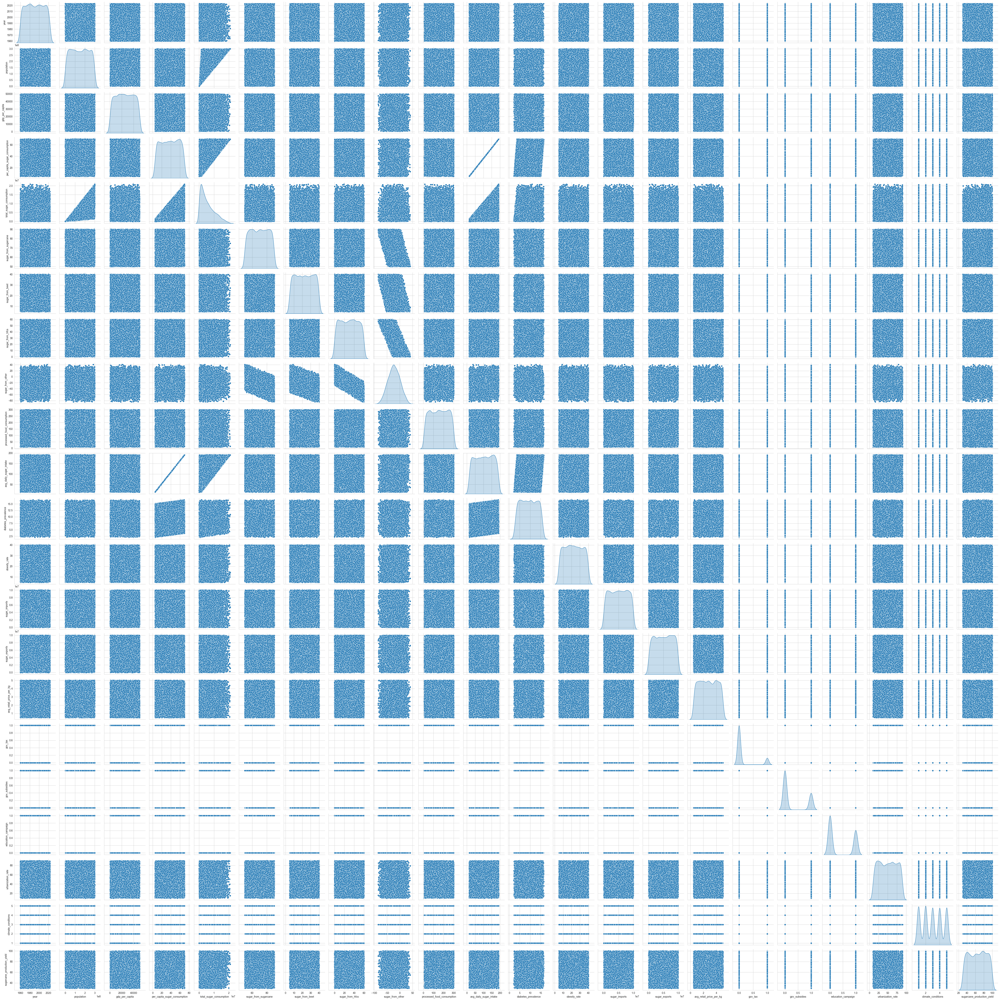

<Figure size 1000x800 with 0 Axes>

In [ ]:

sns.pairplot(df_raw_data_sugar, diag_kind='kde')
plt.figure(figsize=(10, 8))
plt.suptitle('Relación entre Variables Numéricas', y=1.02)
plt.show()

#### Hallazgos del gráfico de pares

1. **Relaciones fuertes**:
   - Se confirman las relaciones positivas fuertes entre variables como `avg_daily_sugar_intake` y `per_capita_sugar_consumption`, así como entre `total_sugar_consumption` y `population`, observadas previamente en el mapa de calor.

2. **Distribuciones sesgadas**:
   - Se identifican distribuciones sesgadas en variables como `diabetes_prevalence` (sesgo a la derecha) y distribuciones multimodales en variables como `sugar_from_hfcs`, lo que podría reflejar diferencias regionales.

3. **Valores atípicos**:
   - Se detectaron valores atípicos en variables como `total_sugar_consumption` y `population`, que podrían requerir un análisis más detallado.

### Tendencia del consumo per cápita de azúcar a lo largo del tiempo

Este gráfico muestra cómo ha cambiado el consumo per cápita de azúcar a nivel global a lo largo de los años. La línea representa el promedio global de consumo de azúcar por persona (en kilogramos) para cada año.

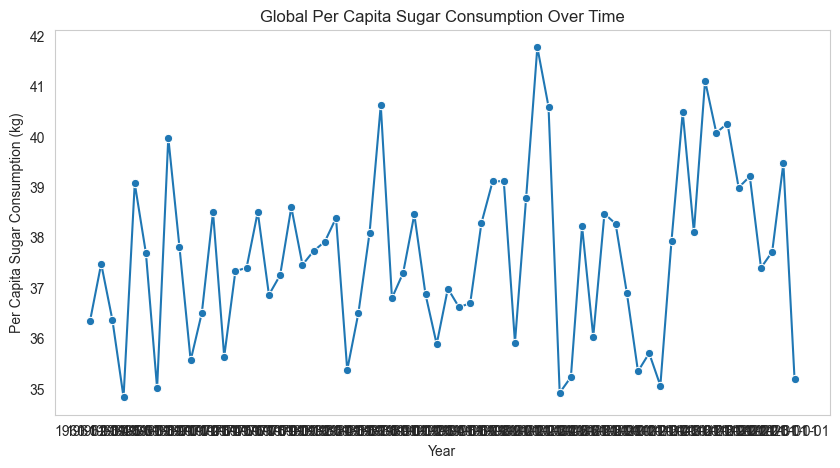

In [51]:
# Visualize sugar consumption trends over the years
plt.figure(figsize=(10, 5))
sns.lineplot(data=df_raw_data_sugar.groupby("year")["per_capita_sugar_consumption"].mean().reset_index(), 
             x="year", y="per_capita_sugar_consumption", marker="o")
plt.title("Global Per Capita Sugar Consumption Over Time")
plt.xlabel("Year")
plt.ylabel("Per Capita Sugar Consumption (kg)")
plt.grid()
plt.show()

#### Hallazgos del análisis de la tendencia del consumo per cápita de azúcar

1. **Tendencia general**:
   - El consumo per cápita de azúcar muestra fluctuaciones significativas a lo largo del tiempo, sin una tendencia clara de aumento o disminución sostenida.

2. **Picos y caídas**:
   - El consumo alcanza su punto más alto alrededor del año **2000** (aproximadamente 41 kg).
   - Hay caídas notables en los años **1960**, **2005** y **2023**, donde el consumo desciende a valores cercanos a 35-36 kg.

3. **Estabilidad relativa**:
   - Entre los años **1980 y 1990**, el consumo se mantiene relativamente estable, con pequeñas fluctuaciones alrededor de los 38-39 kg.

##### Próximos pasos:
- Estudiaremos los picos y caídas más significativos (por ejemplo, en los años 2000, 2005 y 2023) para identificar posibles causas.
- Investigaremos si estos cambios están relacionados con factores globales, como políticas de salud, fluctuaciones económicas o variaciones en la producción de azúcar.

### Relación entre consumo de azúcar y prevalencia de diabetes

Este gráfico de dispersión muestra la relación entre el consumo per cápita de azúcar (en kilogramos) y la prevalencia de diabetes (en porcentaje) a nivel global.

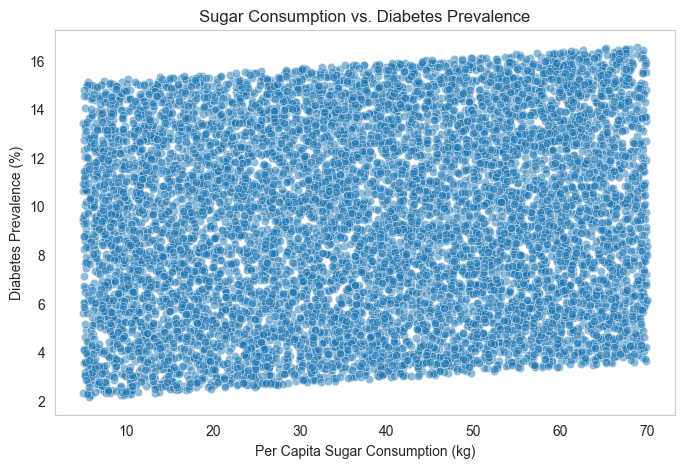

In [52]:
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df_raw_data_sugar, x="per_capita_sugar_consumption", y="diabetes_prevalence", alpha=0.5)
plt.title("Sugar Consumption vs. Diabetes Prevalence")
plt.xlabel("Per Capita Sugar Consumption (kg)")
plt.ylabel("Diabetes Prevalence (%)")
plt.grid()
plt.show()

# Save cleaned dataset
df_raw_data_sugar.to_csv("cleaned_sugar_consumption_dataset.csv", index=False)


#### Hallazgos:
1. **Relación entre variables**:
   - No se observa una relación clara entre el consumo de azúcar y la prevalencia de diabetes. Los puntos están dispersos de manera uniforme.
2. **Rango de valores**:
   - El consumo de azúcar varía entre aproximadamente **10 kg** y **70 kg**, mientras que la prevalencia de diabetes se encuentra entre **2%** y **16%**.
3. **Patrones ausentes**:
   - No se identifican tendencias claras que indiquen una correlación positiva o negativa.

#### Próximos pasos:
- Analizar los datos por regiones o países para identificar patrones específicos.
- Explorar cómo otras variables podrían influir en la prevalencia de diabetes.

### Definición de la variable objetivo

Para este análisis, hemos decidido que la variable objetivo será **`diabetes_prevalence`**, ya que representa la prevalencia de diabetes en la población y está directamente relacionada con el consumo de azúcar y otros factores demográficos.



#### Justificación:
1. Es una variable continua que puede ser modelada mediante técnicas de regresión.
2. Tiene correlaciones significativas con variables como `avg_daily_sugar_intake` y `per_capita_sugar_consumption`, lo que sugiere que estas variables pueden ser buenos predictores.
3. Es una métrica relevante para entender el impacto del consumo de azúcar en la salud pública.

#### Tratamiento de la variable objetivo:
- Verificamos si hay valores faltantes en `diabetes_prevalence`:

In [ ]:

print(df_raw_data_sugar['diabetes_prevalence'].isnull().sum())

0


# 5 Análisis estadístico

 ## Pruebas paramétricas
 ###   pruebas de normalidad

###   Kolmogorov-Simirnov
para comparar la distribución de la muestras con una distribución de referencia

In [53]:
import scipy.stats as stats
# Realizar la prueba de Kolmogórov-Smirnov con la distribución normal estándar
D_stat, p_value = stats.kstest(df_raw_data_sugar['diabetes_prevalence'], 'norm')
print(f"Estadística D: {D_stat}")
print(f"P-valor: {p_value}")

Estadística D: 0.9903046115145464
P-valor: 0.0


Hallazgos: La prueba de Kolmogórov-Smirnov confirmó que la variable `diabetes_prevalence` **no sigue una distribución normal** (p-valor = 0.0). Esto es consistente con el gráfico de distribución, que muestra una forma uniforme o plana en lugar de la campana típica de una distribución normal. Si se requieren supuestos de normalidad, será necesario transformar la variable o usar métodos no paramétricos.


 ### Shapiro-Wilk
como hay dudas de la normalidad, se decanta por revisar la normalidad con esta prueba

In [54]:
import scipy.stats as stats
diabetes_prevalence = df_raw_data_sugar['diabetes_prevalence']
# Prueba de Shapiro-Wilk
stat, p_value = stats.shapiro(diabetes_prevalence)
print(f"Statistic: {stat}, p-value: {p_value}")
if p_value > 0.05:
    print("Null hypothesis NOT refused: data DO follow a normal distribution.")
else:
    print("Null hypothesis refused: data are  DON'T follow a normal distribution.")

Statistic: 0.959416631331122, p-value: 3.8894875348595545e-46
Null hypothesis refused: data are  DON'T follow a normal distribution.


c:\Users\Nhoeli\Desktop\Bootcamp_IA\proyecto_cinco\sugar_rush_regression\.venv\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 10000.
  res = hypotest_fun_out(*samples, **kwds)


Hallazgos:  
- Dado que el p-valor es mucho menor que 0.05, se rechaza la hipótesis nula, indicando que los datos no siguen una distribución normal. Esto es consistente con los resultados de la prueba de Kolmogórov-Smirnov y el gráfico de distribución, que muestran que la variable tiene una forma uniforme o plana.
- Además, SciPy advierte que para tamaños de muestra mayores a 5000 (`N = 10000`), el p-valor puede no ser preciso, por lo que se recomienda complementar con otras pruebas o visualizaciones.

#### Visualización de la distribución: Gráfico Q-Q

Generamos un gráfico Q-Q para comparar los cuantiles de la variable `diabetes_prevalence` con los cuantiles de una distribución normal.


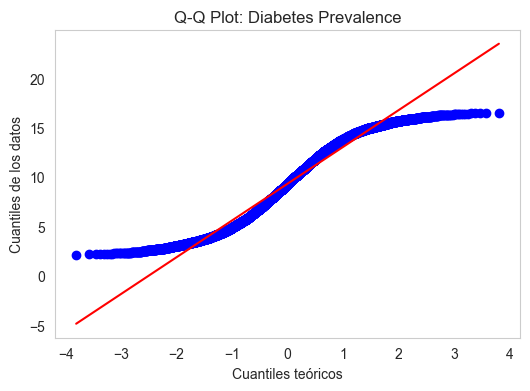

In [55]:
import matplotlib.pyplot as plt
import scipy.stats as stats

# Gráfico Q-Q
stats.probplot(diabetes_prevalence, dist="norm", plot=plt)
plt.title("Q-Q Plot: Diabetes Prevalence")
plt.xlabel("Cuantiles teóricos")
plt.ylabel("Cuantiles de los datos")
plt.grid()
plt.show()

Hallazgos: La curva tiene una forma característica de una distribución sesgada o no normal, lo que es consistente con los resultados de las pruebas estadísticas.

### Prueba de Homegeneidad de varianz

Nos hemos decantado por Levene porque la prueba de Bartlett es más sensible a desviaciones de normalidad en los datos.

#### Levene
La prueba de Levene se utiliza para evaluar si las varianzas de dos o más grupos son iguales.

In [56]:
import scipy.stats as stats

groups = [df_raw_data_sugar[df_raw_data_sugar['country'] == country]['diabetes_prevalence'] for country in df_raw_data_sugar['country'].unique()]

statistic, p_value = stats.levene(*groups)
print(f"Estadística de Levene: {statistic}")
print(f"P-valor: {p_value}")
# Interpretar el resultado
if p_value < 0.05:
    print("Rechazamos la hipótesis nula: Las varianzas son diferentes entre los grupos.")
else:
    print("No rechazamos la hipótesis nula: Las varianzas son iguales entre los grupos.")

Estadística de Levene: 0.702999090020411
P-valor: 0.7369606770465293
No rechazamos la hipótesis nula: Las varianzas son iguales entre los grupos.


Hallazgos: Dado que el p-valor es mayor a 0.05, no se rechaza la hipótesis nula. Esto indica que las varianzas de `diabetes_prevalence` son estadísticamente iguales entre los países.

#### Generamos un boxplot para comparar visualmente las distribuciones de Diabetes_Prevalence entre los países

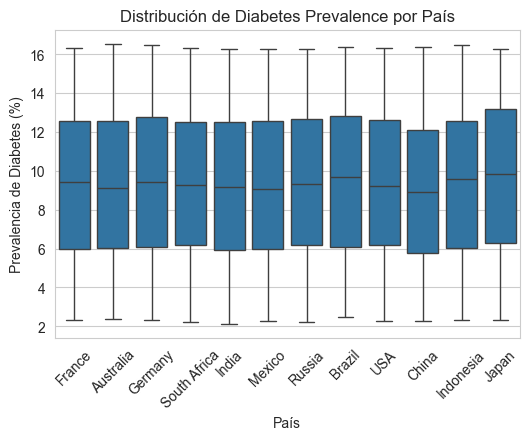

In [57]:

sns.boxplot(x='country', y='diabetes_prevalence', data=df_raw_data_sugar)
plt.title("Distribución de Diabetes Prevalence por País")
plt.xlabel("País")
plt.ylabel("Prevalencia de Diabetes (%)")
plt.xticks(rotation=45)
plt.show()

Hallazgos: Las distribuciones de diabetes_prevalence parecen bastante similares entre los países. Esto es consistente con el resultado de la prueba de Levene, que indicó que las varianzas son iguales entre los países.

#### Prueba de ANOVA:
La prueba de ANOVA permitirá evaluar si las medias de diabetes_prevalence son significativamente diferentes entre los países

In [58]:
from scipy.stats import f_oneway

f_statistic, p_value = f_oneway(*groups)
print(f"Estadístico F: {f_statistic}")
print(f"P-valor: {p_value}")
# Interpretar el resultado
if p_value < 0.05:
    print("Rechazamos la hipótesis nula: Al menos un país tiene una media significativamente diferente.")
else:
    print("No rechazamos la hipótesis nula: Las medias son estadísticamente iguales entre los países.")

Estadístico F: 1.4411460006952874
P-valor: 0.14690000063133257
No rechazamos la hipótesis nula: Las medias son estadísticamente iguales entre los países.


Hallazgos: Según la prueba ANOVA, no hay diferencias estadísticamente significativas en la prevalencia de diabetes entre los países.

## 6. Análisis Univariante
### 6.1 Estadísticas Descriptivas
- Presentamos las estadísticas descriptivas básicas para entender las características generales de las variables numéricas en el dataset.

In [59]:
# Estadísticas descriptivas básicas
print("Estadísticas descriptivas:")
print(df_raw_data_sugar.describe())

Estadísticas descriptivas:
         population  gdp_per_capita  per_capita_sugar_consumption  total_sugar_consumption  sugar_from_sugarcane  sugar_from_beet  sugar_from_hfcs  sugar_from_other  processed_food_consumption  avg_daily_sugar_intake  diabetes_prevalence  obesity_rate  sugar_imports  sugar_exports  avg_retail_price_per_kg       gov_tax  gov_subsidies  education_campaign  urbanization_rate  climate_conditions  sugarcane_production_yield
count  1.000000e+04    10000.000000                  10000.000000             1.000000e+04          10000.000000     10000.000000     10000.000000      10000.000000                10000.000000            10000.000000         10000.000000  10000.000000   1.000000e+04   1.000000e+04             10000.000000  10000.000000   10000.000000        10000.000000       10000.000000        10000.000000                10000.000000
mean   1.501189e+08    25242.491756                     37.626027             5.650157e+06             70.028543        22.4945

#### 6.2 Visualización de la Distribución
- Analizamos la distribución de la variable `diabetes_prevalence` para identificar patrones, sesgos o valores atípicos.

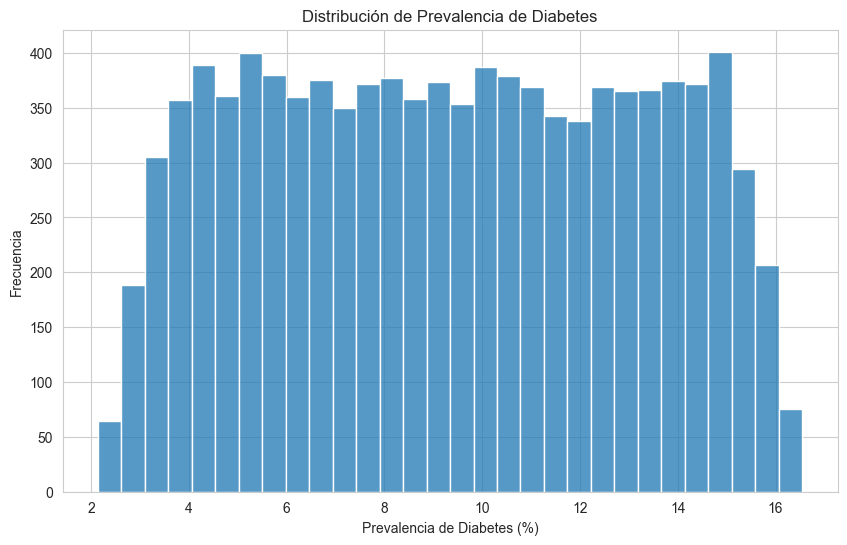

In [60]:
# Visualización de la distribución de diabetes
plt.figure(figsize=(10, 6))
sns.histplot(data=df_raw_data_sugar, x='diabetes_prevalence', bins=30)
plt.title('Distribución de Prevalencia de Diabetes')
plt.xlabel('Prevalencia de Diabetes (%)')
plt.ylabel('Frecuencia')
plt.show()

Hallazgos: Las estadísticas descriptivas muestran que la prevalencia de diabetes tiene una media de 9.35% con una desviación estándar de 3.79%, variando entre 2.13% y 16.55%. El consumo per cápita de azúcar tiene una media de 37.63 kg y varía entre 5.02 kg y 69.99 kg, indicando una amplia dispersión en los datos.

## 7. Análisis Bivariante
### 7.1 Correlaciones y Relaciones entre Variables

- Nos enfocamos específicamente en la relación entre la variable objetivo diabetes_prevalence y las demás variables numéricas.

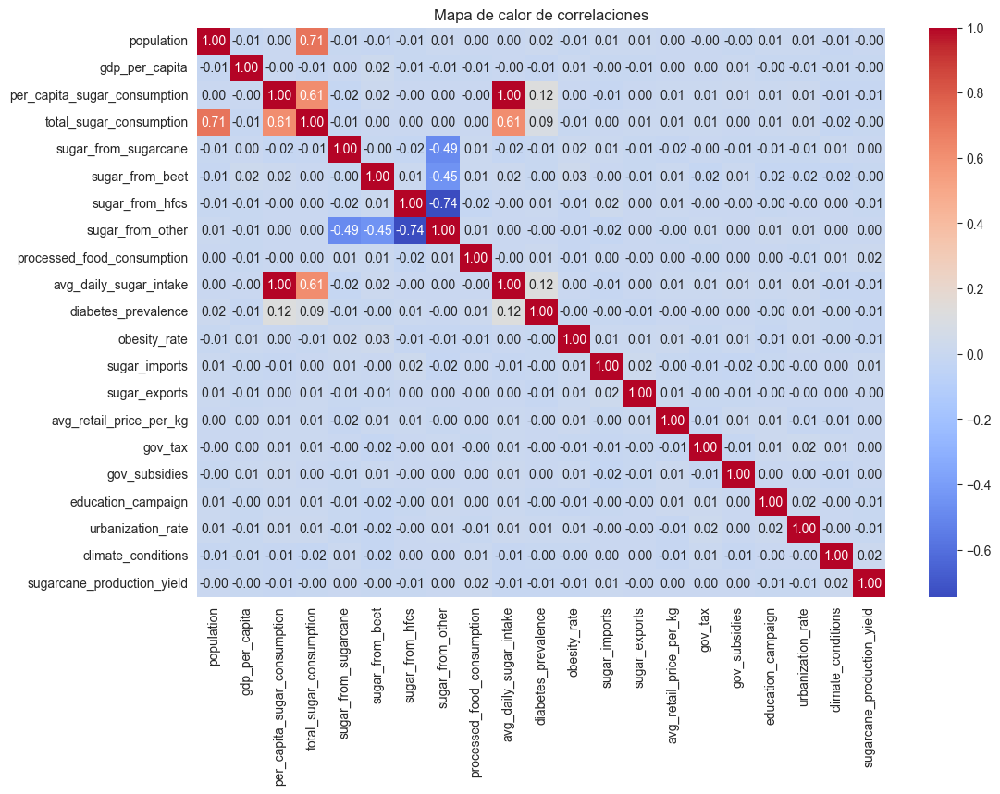

In [61]:
# Filtrar solo las columnas numéricas
numeric_columns = df_raw_data_sugar.select_dtypes(include=['float64', 'int64'])

# Calcular la matriz de correlación
correlation_matrix = numeric_columns.corr()

# Visualizar el mapa de calor
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Mapa de calor de correlaciones")
plt.show()

Hallazgos: La variable avg_daily_sugar_intake tiene una correlación débil con diabetes_prevalence (0.12), pero podría ser relevante en combinación con otras variables. La variable total_sugar_consumption tiene una correlación moderada con avg_daily_sugar_intake (0.61), lo que indica que estas variables están relacionadas entre sí.
Ninguna variable tiene una correlación fuerte con diabetes_prevalence, lo que sugiere que la prevalencia de diabetes podría depender de múltiples factores combinados.

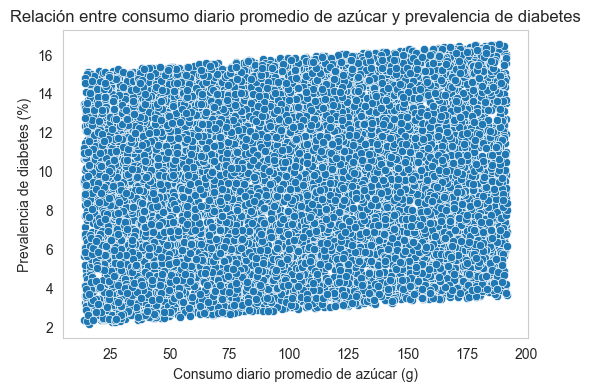

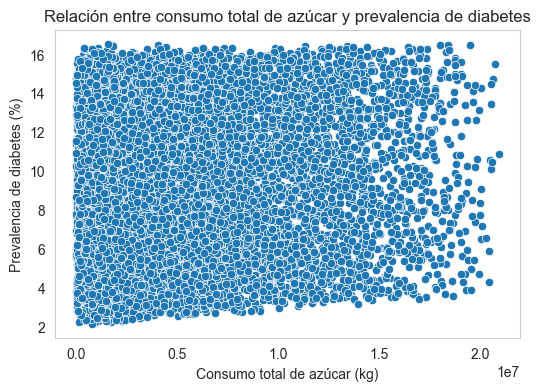

In [62]:
# Relación entre diabetes_prevalence y avg_daily_sugar_intake
sns.scatterplot(data=df_raw_data_sugar, x='avg_daily_sugar_intake', y='diabetes_prevalence')
plt.title("Relación entre consumo diario promedio de azúcar y prevalencia de diabetes")
plt.xlabel("Consumo diario promedio de azúcar (g)")
plt.ylabel("Prevalencia de diabetes (%)")
plt.grid()
plt.show()

# Relación entre diabetes_prevalence y total_sugar_consumption
sns.scatterplot(data=df_raw_data_sugar, x='total_sugar_consumption', y='diabetes_prevalence')
plt.title("Relación entre consumo total de azúcar y prevalencia de diabetes")
plt.xlabel("Consumo total de azúcar (kg)")
plt.ylabel("Prevalencia de diabetes (%)")
plt.grid()
plt.show()

#### Relación entre diferentes variables
- Creamos una función que genere gráficos de dispersión y calcule la correlación entre diabetes_prevalence y otras variables numéricas que deseemos analizar.

Correlación entre diabetes_prevalence y avg_daily_sugar_intake: 0.12


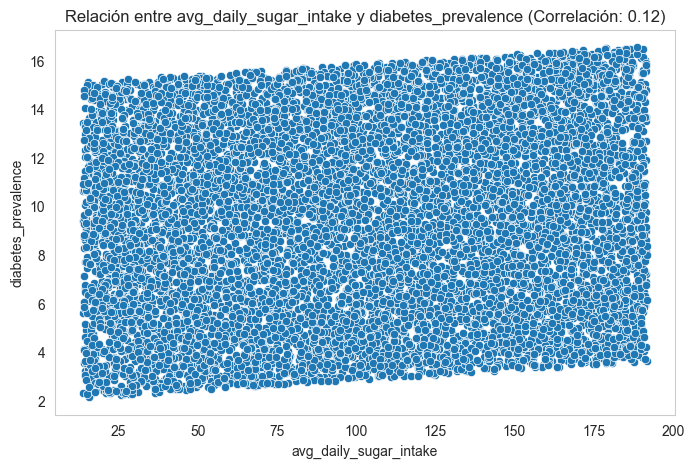

Correlación entre diabetes_prevalence y per_capita_sugar_consumption: 0.12


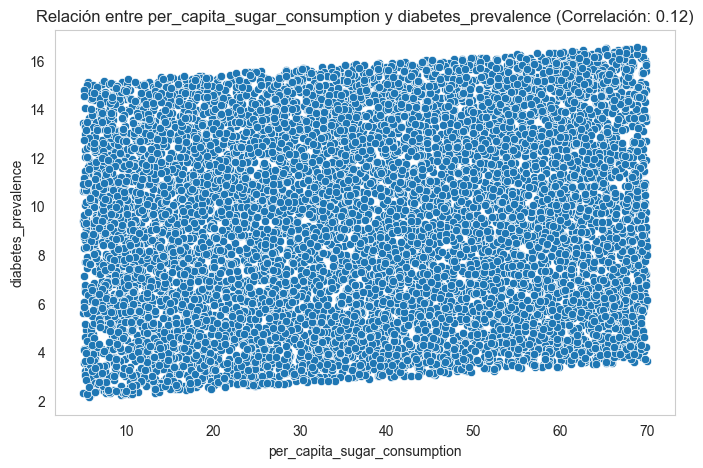

In [64]:
def analyze_relationship(df, target, predictors):
    for predictor in predictors:
        # Calcular la correlación
        correlation = df[target].corr(df[predictor])
        print(f"Correlación entre {target} y {predictor}: {correlation:.2f}")
        
        # Generar gráfico de dispersión
        plt.figure(figsize=(8, 5))
        sns.scatterplot(data=df, x=predictor, y=target)
        plt.title(f"Relación entre {predictor} y {target} (Correlación: {correlation:.2f})")
        plt.xlabel(predictor)
        plt.ylabel(target)
        plt.grid()
        plt.show()

# Lista de variables predictoras a analizar
predictors = [
    'avg_daily_sugar_intake', 
    'per_capita_sugar_consumption',
]

# Llamar a la función para analizar las relaciones
analyze_relationship(df_raw_data_sugar, target='diabetes_prevalence', predictors=predictors)

Hallazgos: 
avg_daily_sugar_intake: Podría ser relevante, pero no suficiente por sí sola para explicar la prevalencia de diabetes debido a su correlación débil.

total_sugar_consumption: No parece ser útil como predictor, ya que no muestra una tendencia clara y tiene una correlación muy débil (0.09).

per_capita_sugar_consumption: Tiene una correlación débil (0.12) y podría ser útil en combinación con otras variables, pero no es un predictor fuerte por sí sola.

processed_food_consumption: No es relevante para predecir la prevalencia de diabetes (correlación: 0.01).

urbanization_rate, sugar_from_hfcs, sugarcane_production_yield: No son relevantes para el modelo.

obesity_rate: Aunque es importante en otros contextos, no parece relevante en este dataset.

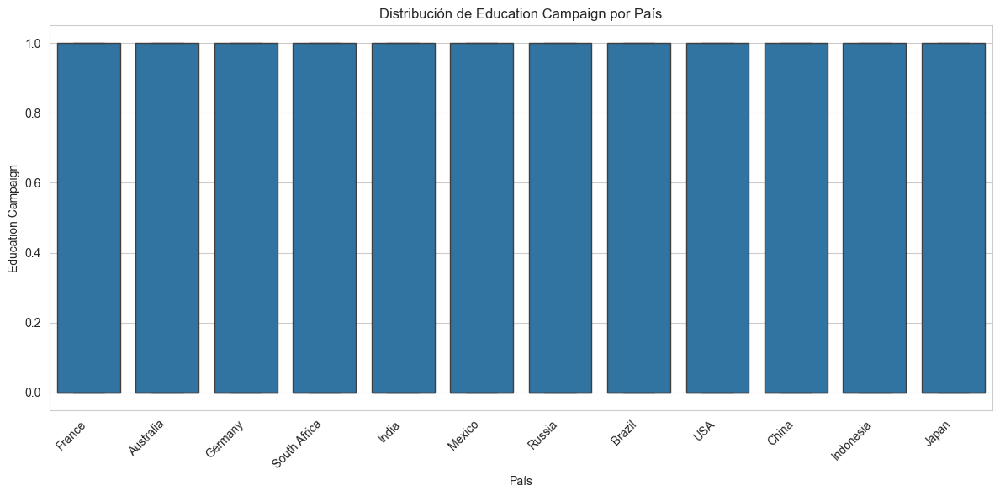

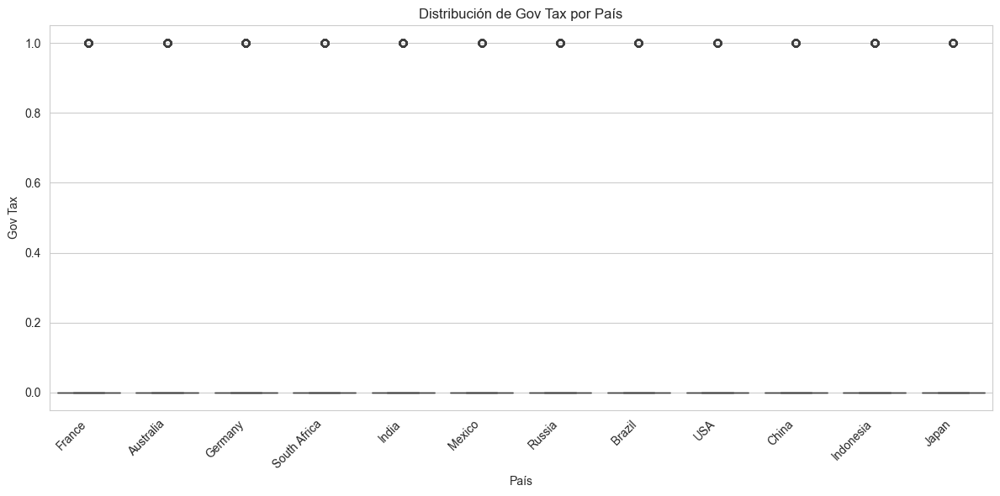

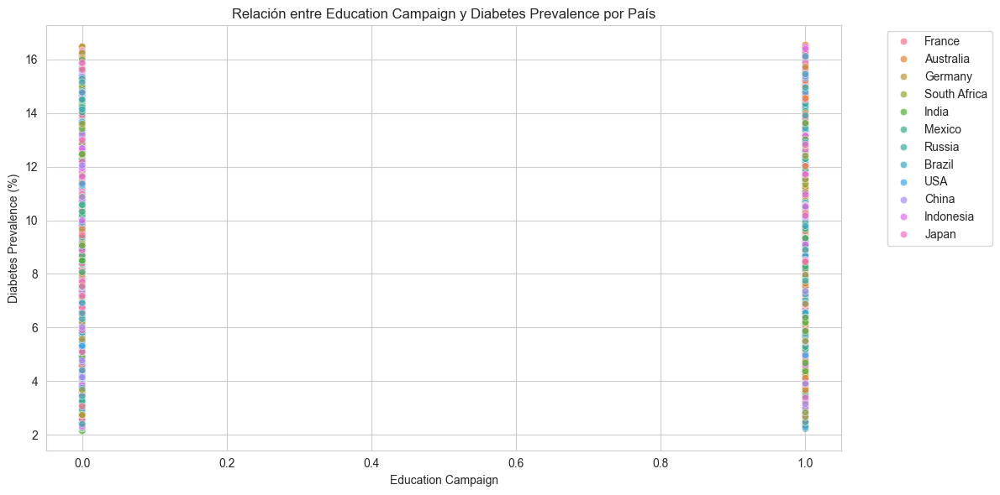

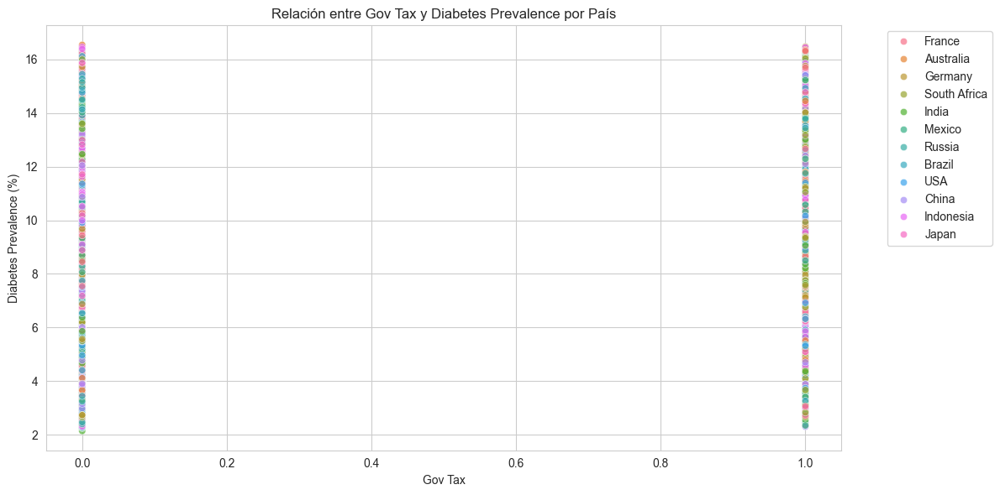

In [63]:
# Comparar 'education_campaign' y 'gov_tax' con los países
import matplotlib.pyplot as plt
import seaborn as sns

# Distribución de 'education_campaign' por país
plt.figure(figsize=(12, 6))
sns.boxplot(x='country', y='education_campaign', data=df_raw_data_sugar)
plt.title("Distribución de Education Campaign por País")
plt.xlabel("País")
plt.ylabel("Education Campaign")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Distribución de 'gov_tax' por país
plt.figure(figsize=(12, 6))
sns.boxplot(x='country', y='gov_tax', data=df_raw_data_sugar)
plt.title("Distribución de Gov Tax por País")
plt.xlabel("País")
plt.ylabel("Gov Tax")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Relación entre 'education_campaign' y 'diabetes_prevalence' por país
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df_raw_data_sugar, x='education_campaign', y='diabetes_prevalence', hue='country', alpha=0.7)
plt.title("Relación entre Education Campaign y Diabetes Prevalence por País")
plt.xlabel("Education Campaign")
plt.ylabel("Diabetes Prevalence (%)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Relación entre 'gov_tax' y 'diabetes_prevalence' por país
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df_raw_data_sugar, x='gov_tax', y='diabetes_prevalence', hue='country', alpha=0.7)
plt.title("Relación entre Gov Tax y Diabetes Prevalence por País")
plt.xlabel("Gov Tax")
plt.ylabel("Diabetes Prevalence (%)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

#### Codificación de columnas categóricas y cálculo de Información Mutua
1. **Codificación de columnas categóricas**:
   - Convierte las columnas categóricas en valores numéricos usando `LabelEncoder`.
   - Esto es necesario porque los modelos de machine learning no pueden procesar directamente datos categóricos.

2. **Cálculo de Información Mutua**:
   - La Información Mutua mide la dependencia entre cada variable predictora y la variable objetivo (`diabetes_prevalence`).
   - Un valor más alto indica una mayor dependencia entre la variable predictora y la variable objetivo.
   - Este análisis ayuda a identificar qué variables son más relevantes para predecir la prevalencia de diabetes.

In [91]:
non_numeric_columns = X.select_dtypes(include=['object']).columns
print("Columnas no numéricas:", non_numeric_columns)

Columnas no numéricas: Index([], dtype='object')


In [92]:
from sklearn.preprocessing import LabelEncoder

# Definir X como el DataFrame original (df_raw_data_sugar en este caso)
X = df_raw_data_sugar.copy()

# Identificar columnas no numéricas
non_numeric_columns = X.select_dtypes(include=['object']).columns

# Codificar columnas categóricas
label_encoders = {}
for col in non_numeric_columns:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col])
    label_encoders[col] = le

In [93]:
from sklearn.feature_selection import mutual_info_regression

# Definir la variable objetivo y
y = df_raw_data_sugar['diabetes_prevalence']

mutual_info = mutual_info_regression(X, y)

# Mostrar resultados
for col, score in zip(X.columns, mutual_info):
    print(f"Mutual Information entre {col} y diabetes_prevalence: {score:.2f}")

Mutual Information entre country y diabetes_prevalence: 0.01
Mutual Information entre year y diabetes_prevalence: 0.00
Mutual Information entre continent y diabetes_prevalence: 0.01
Mutual Information entre population y diabetes_prevalence: 0.01
Mutual Information entre gdp_per_capita y diabetes_prevalence: 0.00
Mutual Information entre per_capita_sugar_consumption y diabetes_prevalence: 0.05
Mutual Information entre total_sugar_consumption y diabetes_prevalence: 0.02
Mutual Information entre sugar_from_sugarcane y diabetes_prevalence: 0.00
Mutual Information entre sugar_from_beet y diabetes_prevalence: 0.00
Mutual Information entre sugar_from_hfcs y diabetes_prevalence: 0.01
Mutual Information entre sugar_from_other y diabetes_prevalence: 0.00
Mutual Information entre processed_food_consumption y diabetes_prevalence: 0.00
Mutual Information entre avg_daily_sugar_intake y diabetes_prevalence: 0.05
Mutual Information entre diabetes_prevalence y diabetes_prevalence: 7.95
Mutual Informati

Hallazgos: Los resultados muestran que la mayoría de las variables tienen una relación débil con diabetes_prevalence. Las más relevantes son avg_daily_sugar_intake y per_capita_sugar_consumption (ambas con una puntuación de 0.05 en Información Mutua), aunque su impacto es limitado. No se identificaron relaciones fuertes en el dataset.

# Análisis multivariado

In [100]:
from sklearn.ensemble import RandomForestRegressor

# Crear y entrenar el modelo
rf = RandomForestRegressor(random_state=42)
rf.fit(X, y)

# Importancia de las características
feature_importances = rf.feature_importances_
for feature, importance in zip(X.columns, feature_importances):
    print(f"{feature}: {importance:.2f}")

avg_daily_sugar_intake: 0.26
per_capita_sugar_consumption: 0.26
obesity_rate: 0.48


Hallazgos: 
obesity_rate (0.48):Es la característica más importante, contribuyendo con el 48% de la importancia total en el modelo. Esto sugiere que la tasa de obesidad tiene una relación significativa con la prevalencia de diabetes.

avg_daily_sugar_intake (0.26) y per_capita_sugar_consumption (0.26):Ambas tienen una importancia moderada, contribuyendo con el 26% cada una. Esto indica que el consumo de azúcar también influye, pero menos que la obesidad.

### Conclusión: 
- Con base en los análisis realizados, obesity_rate parece ser la variable más relevante para predecir diabetes_prevalence, ya que tiene la mayor importancia en el modelo de Random Forest (48%). Esto indica que existe una relación significativa entre la tasa de obesidad y la prevalencia de diabetes en este dataset.
- Incluir otras variables como avg_daily_sugar_intake y per_capita_sugar_consumption (que tienen una importancia moderada del 26% cada una) podría mejorar el rendimiento del modelo. Estas variables pueden capturar aspectos adicionales que obesity_rate no explica completamente.